# Project Notebook Introduction

Welcome to the main project notebook! 

## What is the goal of this notebook?

This notebook should contain your project write-up and the analyses conducted on the provided data. For each project, the notebook provides links to a few articles on the subject of the notebook, and a few examples of analyses that you could/should do. But it is not at all exhaustive: If you need to install more python packages or other software, do so. If you want to search for additional literature to support your writing, do so!

Your goal is to work from these examples towards answering the list of questions specific to each of the projects, and write a coherent report following the structure at the bottom of this notebook. Your colleagues (and I) will read and grade the result. So, make sure that you provide ample and adequate descriptions of your results and methodologies. This notebook is likely going to get rather large as you add analyses, so best to use markdown cells and headings to create a table of contents structure, as you can see in the ToC menu on the left of the Colab user interface.  

If this project feels a bit open-ended, that's because it is - just like actual research! ***But you are not alone!*** You will collaborate with your fellow students in your group! I also want to push you towards asking any and all questions in the canvas discussions, and directly to me via email and the Friday Zoom meetings. I'm here to help, and will give hints if you ask me the right questions. 

You are free to make this as beautiful and far-reaching as you feel like. But keep track of time, you will need to finish this the week before the exam. Perfect is the enemy of good, beware. 


## Installation etc.

The first part of this notebook is shared across the different projects, as the notebook will download the data for all the projects in the same way. 

The first installation and setup cells may take a little while to run as they fetch and install all the required software. It's also likely there's going to be a LOT of outputs that are irrelevant. Feel free to delete the output of this cell after it runs to free up space. 

In [1]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex



Extracting templates from packages: 100%
     |████████████████████████████████| 3.1MB 13.2MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.6MB 9.7MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.


In [2]:
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

/usr/local/lib/python3.7/dist-packages/nilearn/datasets/__init__.py:90: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


### Download of data: surfaces for plotting and project data

Both the surface data we'll use for visualization and the project fMRI data are on figshare. From Figshare, we can download the data and place them in the Colab virtual machine. You don't have to read/understand this code - it's all boilerplate stuff to set up Colab's virtual machine so that it works with our data. 

***More important:*** For a brief description of the data of the different projects, --and a couple of very important parameters of these acquisitions which you will need later-- please consult the [figshare website](https://figshare.com/articles/dataset/fMRI_Teaching_Materials/14096209)

In [3]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /content/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 202, done.
remote: Counting objects: 100% (202/202), done.
remote: Compressing objects: 100% (174/174), done.
remote: Total 21798 (delta 106), reused 76 (delta 28), pack-reused 21596
Receiving objects: 100% (21798/21798), 289.15 MiB | 25.82 MiB/s, done.
Resolving deltas: 100% (16788/16788), done.


## Putting these tools to first use

Ok, why all this complicated hassle? Well, we want you to have a playground that allows you to really get to know the data. 

#### Where are the data files?

The data have now been downloaded, and you can check out the data on disk by using the command line. For example, in a code cell you can preface the line with an exclamation mark to give a commandline command: 

`!ls /content/data/prf_mapper_59k`

Will give you the contents of the prf experiment data folder. But, on the left in the CoLab UI you can also find a file navigator, next to the table of contents, search and code snippet elements. Feel free to have a look around!

#### Okay, but what can we do with these tools?

After downloading and auto-editing the data required for working with pycortex, we can now import pycortex. We'll use pycortex for plotting of the results, which is using only a subset of its awesome features. Remember that [brain viewer of semantic maps](http://gallantlab.org/huth2016/)? Also made using pycortex! If you have some spare time and want to play around with this awesome package, please have a look at the [pycortex docs](https://gallantlab.github.io/pycortex/)

In [4]:
import cortex as cx

And, just to highlight the type of visualisation we'll be doing, a quick demo of the way we'll be using it. We'll be using the surface from the Human Connectome Project, which we named `hcp_999999`. So that's the 'subject' name we use to get and plot surface data using pycortex. 

Don't worry if you see a bunch of warnings and stuff - it will create the figure we asked for from what is in essence a single line of code: the curvature of the cortical surface of this standard surface. **Gorgeous!** 

Feel free to change the datatype to `'thickness'`, for example. Also **Gorgeous!**

Generating a flatmap cache
Failed to get connection
** (inkscape:3290): CRITICAL **: 20:08:58.542: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3290): CRITICAL **: 20:08:58.542: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3290): CRITICAL **: 20:08:58.542: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


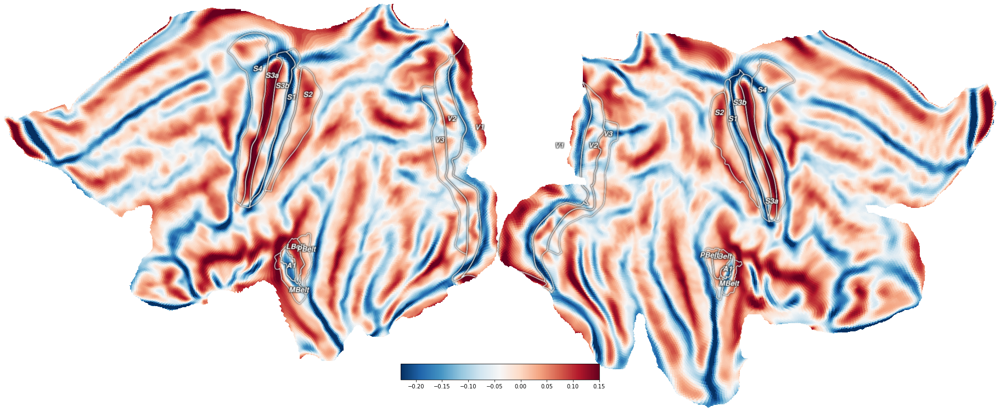

In [ ]:
curv_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='curvature')
cx.quickshow(curv_vertices);

### Flatmaps?

But what the hell are we looking at, even? The cortical surface or ribbon is topologically a ball per hemisphere. That is, each hemisphere can be inflated to the shape of a sphere (let's not get stuck on the question how a hemisphere can also be a sphere :-) ). Flatmaps are created by cutting the inflated cortical surface at specific locations (see the black lines in the left figure), and then letting the computer flatten the resulting mesh into a planar surface. 

<img src="https://github.com/VU-Cog-Sci/wiki/raw/master/imgs/flatten/image9.png" alt="where do we cut the surface" width="45%" style="align:left;"/> <img src="https://universe-review.ca/I10-13-BrainMap3.jpg" alt="Visual, auditory and somatosensory brain regions" width="45%" style="align:right;"/>

This flatmapping has the advantage that we can view the entire cerebral cortex in one fell swoop, but the downside is that it is hard to orient yourself to where things are. That's why we've added some lines that surround certain labeled regions of interest - they are the visual, auditory and somatosensory/motor cortex. In the right image they are the blue, red and green areas of the brain, respectively. We're using exactly the flattened surfaces of the right column in the right figure, but ours are rendered side-by-side. Recognize them from the curvature figure?

Take a few minutes to orient yourself on these surfaces, using the atlas in the right figure. Where are the darker areas of this atlas on the inflated surfaces, and where do they end up on the flattened surface? Same for the coloured regions - make sure you have an idea of where things are. This will greatly increase your maneuverability in the brain. 

You'll need that maneuverability because we'll be working with surface data in this project: all the data you will load is surface-based, and should be visualized as shown in this introduction. In many ways, surface-based fMRI data is simpler than volume-based data. Instead of 4-dimensional, it's 2-dimensional: vertices by timepoints. This makes it less of a bookkeeping hassle to use. Let's have a look at some of your fMRI time-course data!


## Loading the functional data for your project

In the cell below we're loading the functional MRI files you'll be working with. There's a different set of files that you open and read depending on the project that you'll be doing. Once loaded, though, all of these datasets have the same format - they're all formatted for the same surface that you've already plotted data into. 

In [5]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 
# There are 3 separate versions here, one for each project-dataset.


#########################################################################################################
###############
############### pRF mapping data
###############
#########################################################################################################

# tseries_raw = np.nan_to_num(np.concatenate([load_surf_data(
#         os.path.join('/content/data/prf_mapper_59k', f'sub-02_task-prf_space-59k_hemi-{hemi}_run-median_desc-bold.func.gii'))
#          for hemi in ['L', 'R']]))

#########################################################################################################
###############
############### somatotopic mapping data
###############
#########################################################################################################

#tseries_raw = np.concatenate([load_surf_data(
#        os.path.join('/content/data/soma_mapper_59k', f'sub-01_ses-01_task-soma_run-median_space-59k_hemi-{hemi}_sg_psc.dtseries.gii'))
#         for hemi in ['L', 'R']])

#########################################################################################################
###############
############### hrf mapping data
###############
#########################################################################################################

tseries_raw = np.concatenate([load_surf_data(
         os.path.join('/content/data/hrf_mapper_59k', f'sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.{hemi}.dtseries.gii'))
          for hemi in ['L', 'R']])


# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 440)


## Raw Data Observations
### What amount of preprocessing has already been done?

If the signals have been filtered already, there should be no drifts in the data. Also, if the data time-courses have already been z-scored or converted to percent signal change, the mean of the signals should already be 0. If the data are in 'units' of % signal change, the maximal excursions of the signal timecourse will be on the order of 10-20. If they've been z-scored, their standard deviation should be exactly 1 (duh!). 

Like we learned in the preprocessing lecture and practical, the standard deviation over time also gives us a lot of valuable information regarding signal quality in non-z-scored data. Let's have a quick look at these different aspects of the data on flatmaps. This will also show us whether we were scanning the whole brain or not - an aspect of the data acquisition that you may want to mention in your report...

**Note**
If we plot data that didn't come from pycortex's surface data itself, but from our own files, we need to supply a subject. Adding the colormap is just for clarity. 

Generating a flatmap cache
Failed to get connection
** (inkscape:3333): CRITICAL **: 14:48:14.429: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3333): CRITICAL **: 14:48:14.429: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3333): CRITICAL **: 14:48:14.429: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:3336): CRITICAL **: 14:48:15.858: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3336): CRITICAL **: 14:48:15.858: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3336): CRITICAL **: 14:48:15.858: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


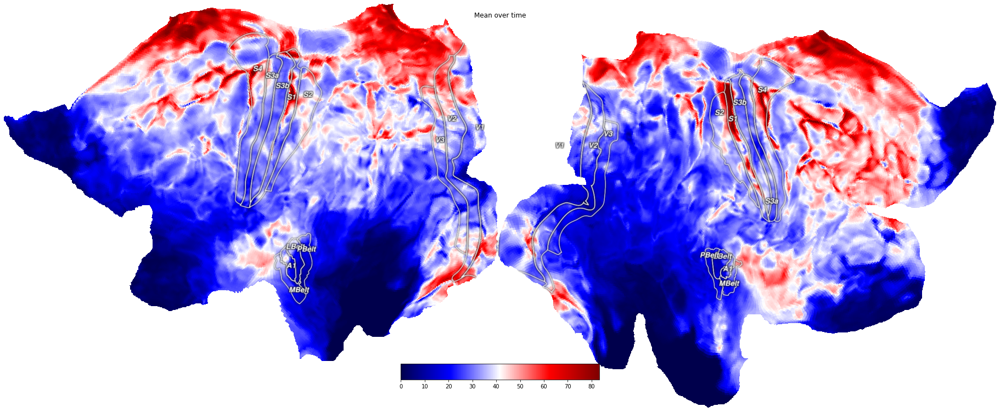

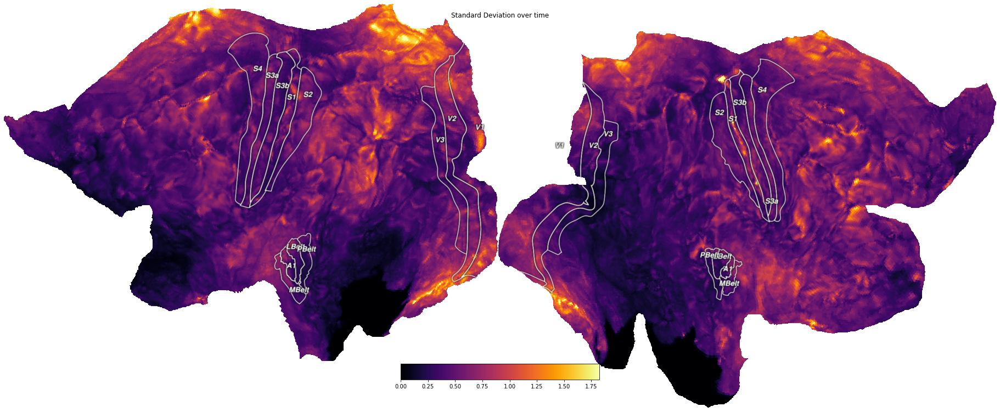

In [ ]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

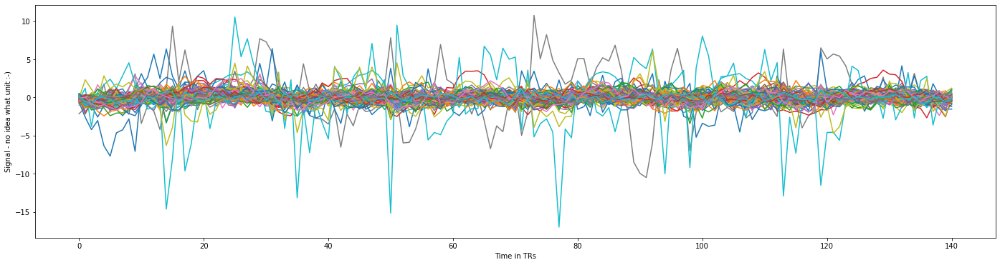

In [ ]:
# now, let's get some random time-courses to check whether there's still drift:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');

Now, depending on your dataset you may see that the top of the brain is brighter than the bottom. This is due to the fact that the top of the brain is closer to the coils. Moreover, you may see some really interesting web-like pattern on the surfaces that you've plotted. Like this:

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/lqPTAzK.png" alt="Model pipeline" width="500" align="right" />

What is that stuff? Why isn't it homogeneous? The answer is, we're looking at blood, and at 7 Tesla (at which all these data were acquired) these veins show up very strongly. Their presence has a strong influence on whether you can find any 'activation', as they may get in the way of what you want to find. Keep this in mind!

### Questions concerning signal quality

From these simple surface and time-course plots above, we can immediately gather a couple of things. Try to answer the following questions from both the flatmaps and the random time-courses. 

1.   have these data been z-scored or percent signal changed? **Check the colorbars!** What would they look like if they'd been z-scored?
2.   have these data been high-pass filtered? **Check the timecourses!**
3.   where do you see the biggest signal fluctuations? What are the likely origins of these fluctuations? 

You can use these insights in writing the data description section of your report! Note that there are differences between the different project-datasets, so make sure you inspect your own!

<font color='red'>-- Important: --</font>

**Your conclusions about the state of the data for your project will tell you what to do: you now have to decide whether to perform additional preprocessing, such as temporal filtering, percent signal change conversion, etc.**

## Atlas tools

It's a very powerful thing to be able to plot stuff on the entire cerebral cortex in one go. But sometimes you want to focus on a single brain region. You can use your own methods to define regions of interest, for example using a separate mapper experiment that allows you to select voxels/vertices of interest - within which you'll then perform your analysis of interest. 

But we'll use the existing multi-modal parcelation atlas from the Human Connectome Project, from the [Glasser et al Nature study](https://www.nature.com/articles/nature18933) that was mentioned a couple of times in the lectures. This is the atlas shown in the right flatmap figure above, in the 'Flatmaps' section.

The following cells show how to select a given ROI's data - something that you may want to do quite a lot in your own analyses. It serves to zoom into a specific region of interest, but also means that you can 'pilot' time-consuming analyses on smaller amounts of data while still taking care to test your entire analysis. 

In [6]:
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)

### Selecting an ROI

One can now easily use a test to create boolean arrays into a specific ROI. For example, we can check which ROI is indexed by the number 1. Make sure you understand what I did with the `vmin` and `vmax` settings of the `Vertex` object! You may be able to use these little tricks later!

Failed to get connection
** (inkscape:3336): CRITICAL **: 20:26:09.364: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:3336): CRITICAL **: 20:26:09.364: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:3336): CRITICAL **: 20:26:09.364: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


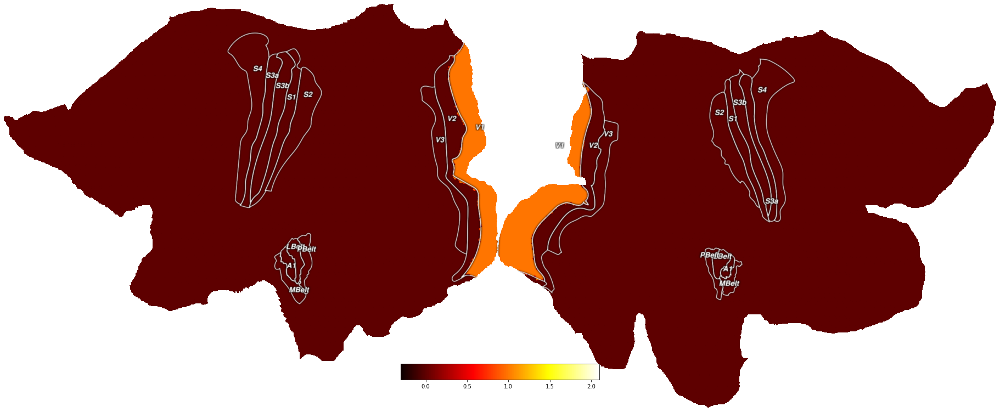

In [ ]:
f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));

This means we can also select those parts of the brain and single out the responses from just a single region of interest! That should be much more manageable. For now, we'll select the region we highlighted above, V1 - the first region of the cortical visual hierarchy. It turns out that 2 out of our 3 experiments did something very very visual, with the third also showing visual stimuli. So let's see what we end up with! Once you've understood the idea of the following code cell, feel free to experiment with the actual index of the ROI this analysis works with!

***Note 1:*** whether this raw data visualization is very informative depends on your experiment. So, don't worry if this doesn't show you anything here. 

***Note 2:*** See how I'm trying to label all my figure axes so that it's clear what the units and elements of the data are? **It's very important that you do the same for your report!**

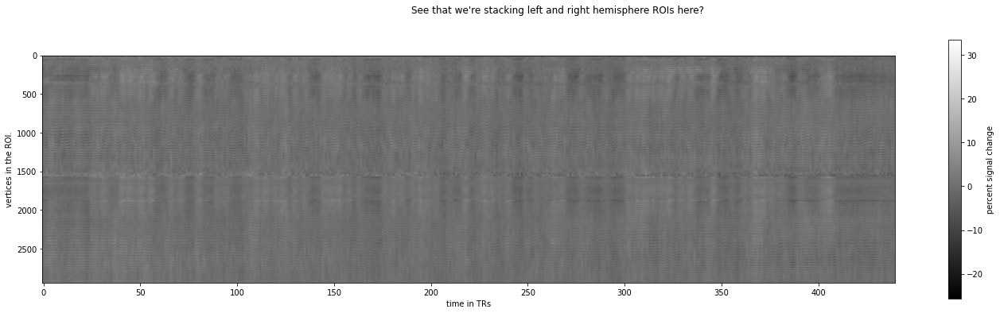

In [7]:
roi_boolean_mask = atlas_data_both_hemis == 1

# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

f = plt.figure(figsize=(24,6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");

To help you out a bit, here's a dictionary that gives you the indices in the atlas for the regions that are outlined in the flatmaps. This may help you find your way later on :-)

In [8]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

# Report Outline

This part of the notebook outlines the sections we expect your report to contain. You can use this part as a to-be-filled-in template for your project report. The total text should not be too long, so that you don't needlessly pain your long-suffering colleagues. Say, 2000 words max. 



## Title 

a title is more important than you think - a good title draws the reader in. An excellent title is a bit playful without going over the top. Before you finish the report, spend a few minutes brainstorming on the perfect title. It pays off.

## Abstract

An abstract is a brief (say, around 200 words) summary of the research, methods, as well as the findings and their significance. 

## Introduction

Why this research? What does this specific experiment teach us about the brain? Be sure to discuss the articles that go with your project, and any and all additional articles that you've found. Feel free to add figures from published articles to clarify the approach. 

## Methods 

In the methods section, you should describe the experiment and your analyses in as much detail as possible, or at least to the level of detail required for others to replicate your findings. Clearly you don't have all the information regarding scanning parameters, etc, so we won't fault you for not including those here. 

In [59]:
# Some Notebook Configurations 
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns
plt.style.use("seaborn-paper")
get_ipython().magic('matplotlib inline')
get_ipython().magic("config InlineBackend.figure_format = 'retina'");plt.style.use("seaborn")
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (11.25, 5.25)

### 0) Data

#### 0.A.) fMRI data

- The data was acquired using a 7T scanner.
- The data is not volume data, but surface-based.
- We have $N=440$ timepoints (total TR).
- Each timepoint (TR) consists of 118_584 measurements.
- Since a longitudinal fissure or division separates the brain into two distinct cerebral hemispheres, we are looking at approx. 59_000 vertices per hemisphere (Recap:surface based).
- Hence  $X \in \mathcal{R}^{(59000\times2) \times 440} \approx \mathcal{R}^{118584 \times 440}$

Lets look at 5 random vertices to get some idea of the data

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fe3ec38bad0>,
      dtype=object)

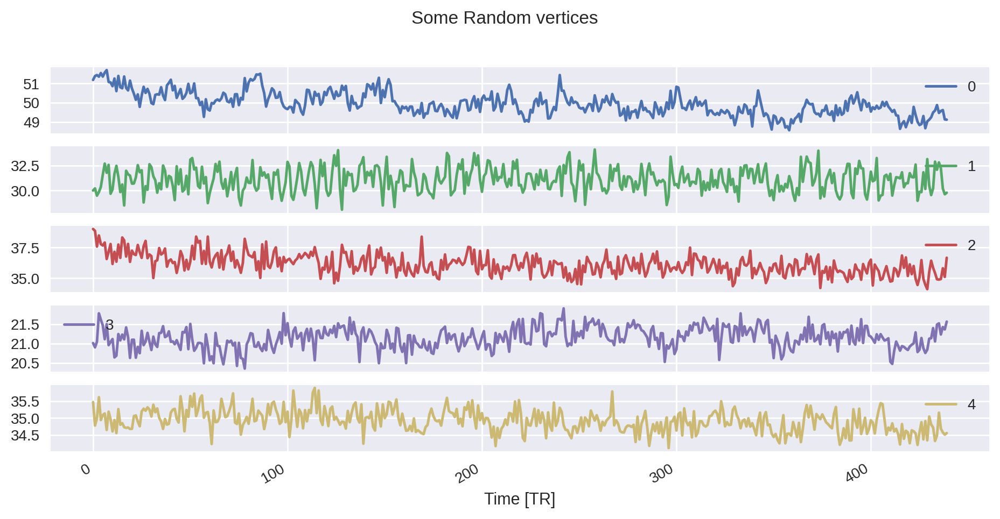

In [10]:
seed = np.random.choice(np.arange(tseries_raw.shape[0]), 5)
pd.DataFrame(tseries_raw[seed]).T.plot(subplots=True,grid=True,xlabel="Time [TR]",title="Some Random vertices")                                                                        

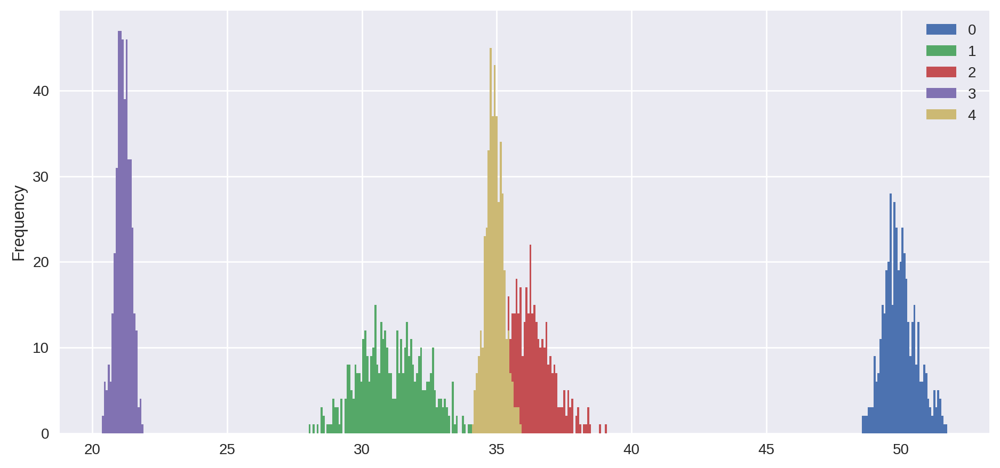

In [11]:
pd.DataFrame(tseries_raw[seed]).T.plot.hist(bins=425,grid=True);

The data has not been Z-scored, otherwise we'd expect $x_i \sim \mathcal{N}(0,1)$. Pct change is equally unlikely. However, for the 5 random vertices we observe normal populations, although scaled in both std and location, we see that fitting kernels on those densities may be straight forward.


Next, we are checking if the data has been high pass filtered, i.e. if low frequency noise has been taken care of (removed). We can either obtain the distribution of frequencies of all the measurements and see if we likely have low frequency noise left, or we can simply check if the data is trended by checking its correlation with time. Doing that we can either obtain a distribution of $\rho(x_{i}, t) \ \forall \ i$, but it should be sufficient to draw a sample of 10_000 measurements.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


Text(0.5, 1.0, '$\\rho_{x(t), t}$')

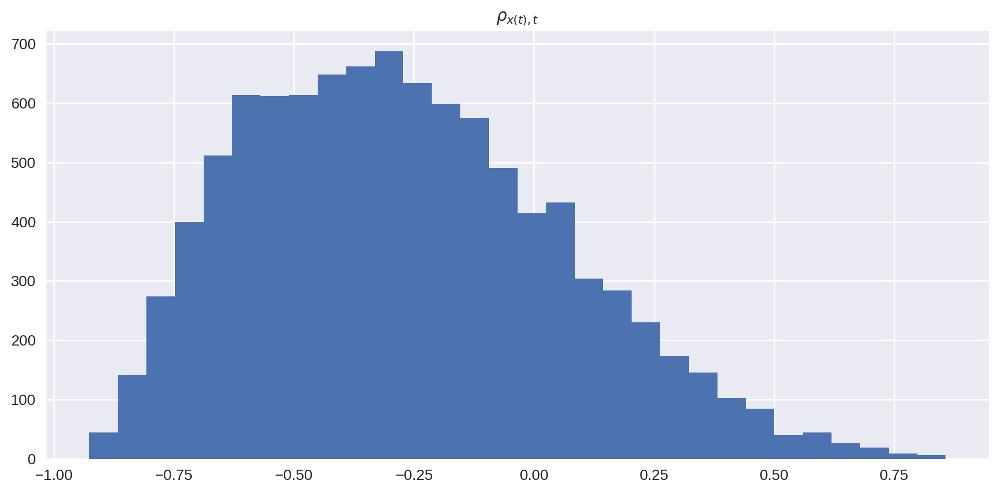

In [13]:
sample_size = 10_000
corr = lambda x, y : ((x*y).mean()-x.mean()*y.mean())/(x.std()*y.std())
pd.DataFrame(tseries_raw[np.random.choice(np.arange(tseries_raw.shape[0]), sample_size)]).T.apply(lambda x : corr(x, np.arange(440))).hist(bins=30);
plt.title("$\\rho_{x(t), t}$",fontsize=11)

We can see that a large part of the sample has potentially a large negative drift. We conclude that we should high pass filter the data.

Next, lets create a global signal to get a more macro view of the variability.

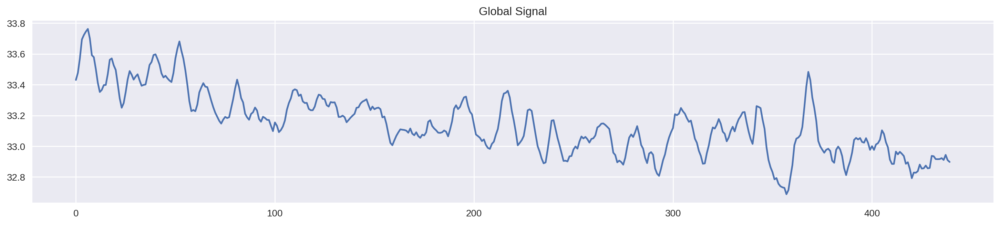

In [14]:
pd.DataFrame(tseries_raw).mean().plot(figsize=(18,3.5),grid=True, title="Global Signal")

Next to the previously identified drift, we can also see a quasi-random global activation pattern, containing activation derivatives with unequal height and amplitude. Btw the drift is porbably due to either increasing thermal noise from the scanning device or slowly increasing heterogenity of the magnetic field.


In [15]:
from scipy.signal import periodogram

Since we acquire one measurements every .945 seconds (TR=.945), we have $\frac{1}{TR} = \frac{1}{0.945} = 1.06$ measurements per seconds (SF=1.06). (i.e surfaces). 

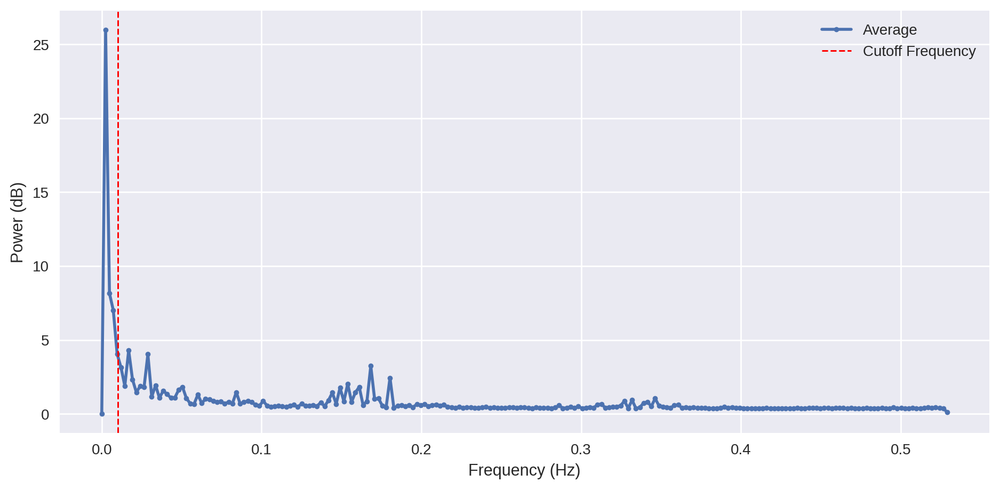

In [16]:
TR = .945
SF = 1 / TR
freq, power = periodogram(tseries_raw, fs=SF)
pd.DataFrame({"Average" : power.mean(axis=0)}, index=freq).plot(ylabel="Power (dB)",xlabel="Frequency (Hz)",grid=True, lw=2, style=".-");
plt.axvline(x=0.01,color='r',ls='dashed', lw=1.0802);plt.legend(["Average","Cutoff Frequency"])

We are inspecting the Average powers of the frequencies of all the voxels to determine the existence of low frequency noise as well as a reasonable threshold. The threshold indicated by the dashed red line is 0.01 Hz. If we use a cutoff of 0.01Hz, then every signal that takes longer than 100s to complete its cyvle is removed. We think that this is a reasonable choice, given we cannot confidently identify the signal components which account for powers in $[.01, \approx .03]$, meaning they might be of interest. To implement the proposed filter, we use sigma according to $\sigma \approx \frac{\mathrm{cutoff}_{sec}}{2 \cdot \mathrm{TR}_{sec}} =\frac{100}{2 \times .945}= 52.91 $

In [17]:
from scipy.ndimage import gaussian_filter as Ker

We use a normal kernel to extract the low frequency noise, the drift.

In [18]:
sigma = 100 / (2 * TR) 
drift = Ker(tseries_raw, sigma)

In [19]:
drift.shape == tseries_raw.shape

True

In [20]:
tseries_filt = tseries_raw - drift

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fe3eb354110>,
      dtype=object)

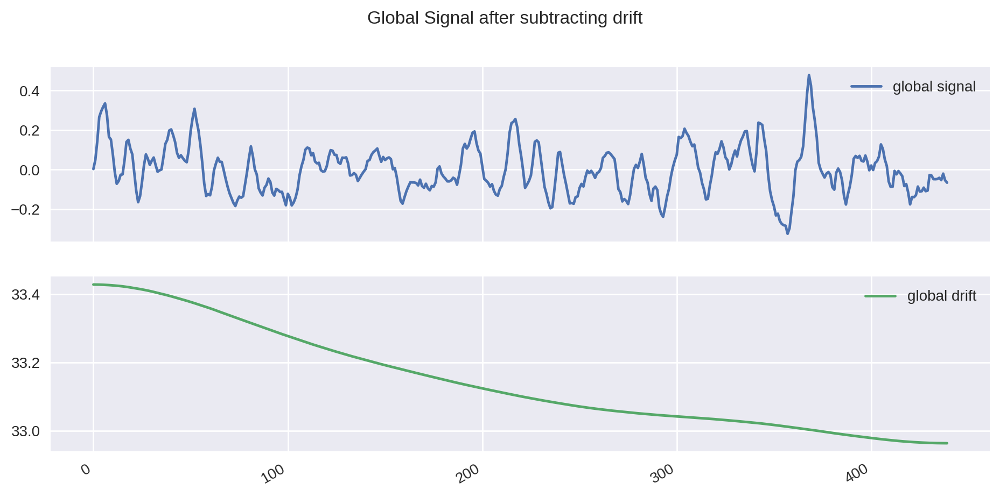

In [21]:
pd.DataFrame({"global signal": tseries_filt.mean(0),
                 "global drift" : drift.mean(0) }).plot(subplots=True,grid=True, title="Global Signal after subtracting drift")

Text(0.5, 1.0, '$\\rho_{x(t), t}$ after subtracting drift')

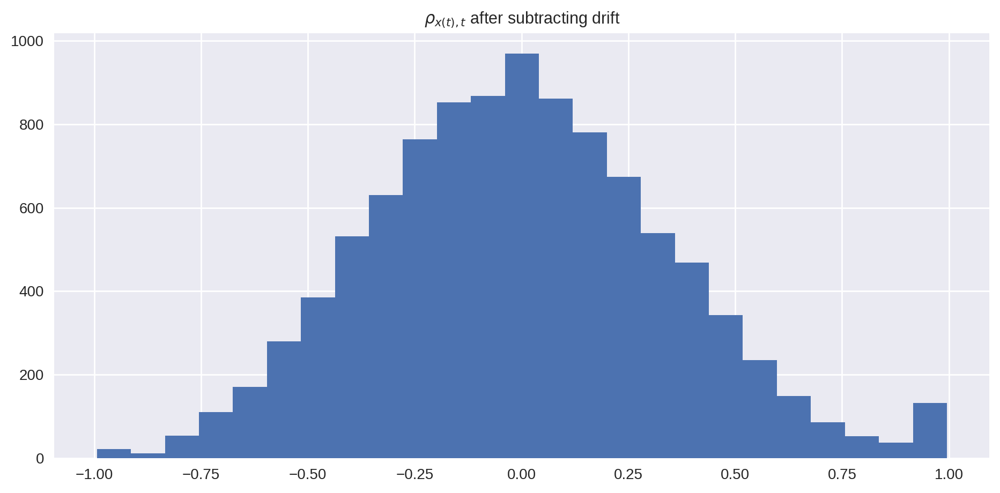

In [22]:
sample_size = 10_000
pd.DataFrame(tseries_filt[np.random.choice(np.arange(tseries_filt.shape[0]), sample_size)]).T.apply(lambda x : corr(x, np.arange(440))).hist(bins=25);
plt.title("$\\rho_{x(t), t}$ after subtracting drift",fontsize=11)

Now, after removing the drift part of the data, we expect different locations of our previously observed 5 random samples. Scale shouldnt change.

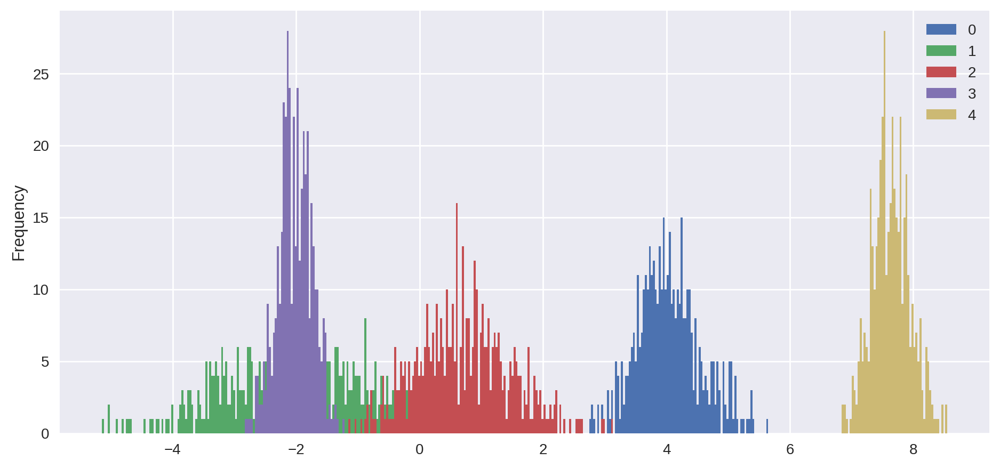

In [23]:
pd.DataFrame(tseries_filt[seed]).T.plot.hist(bins=425,grid=True);

As expected, the vertices densities change in location, but not in scale. Given the arbitrary nature of the raw data, we should not care about it as long as variance isnt lost.

Now, we transform the data. We test three types of possible transformations.

In [24]:
psc = lambda data, base : np.nan_to_num(((data.T/np.mean(data, 1)).T - 1) * 100) if base=="mean" else  np.nan_to_num(((data.T/np.median(data, 1)).T - 1) * 100)

In [25]:
tseries_filt_psc_median = pd.DataFrame(psc(tseries_filt, base="median")).T
tseries_filt_psc_mean = pd.DataFrame(psc(tseries_filt, base="mean")).T
tseries_filt_z = pd.DataFrame((tseries_filt.T - np.mean(tseries_filt,1))/np.std(tseries_filt,1))

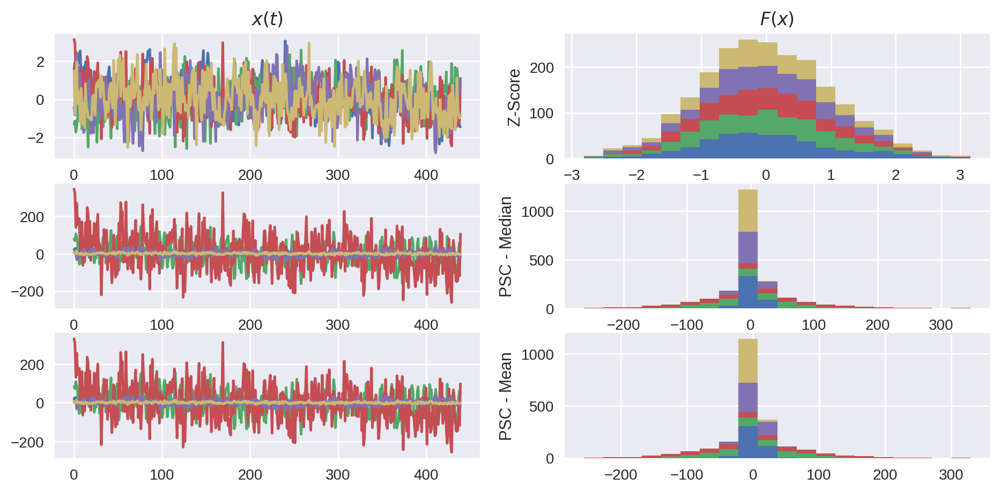

In [26]:
fig, axes = plt.subplots(3,2)
tseries_filt_z[seed].plot.hist(stacked=True,bins=20,ax=axes[0,1],legend=False,title="$F(x)$");axes[0,1].set_ylabel("Z-Score")
tseries_filt_psc_median[seed].plot.hist(stacked=True,bins=20,ax=axes[1,1],legend=False);axes[1,1].set_ylabel("PSC - Median")
tseries_filt_psc_mean[seed].plot.hist(stacked=True,bins=20,ax=axes[2,1],legend=False);axes[2,1].set_ylabel("PSC - Mean")

tseries_filt_z[seed].plot(ax=axes[0,0],legend=False,title="$x(t)$")
tseries_filt_psc_median[seed].plot(ax=axes[1,0],legend=False)
tseries_filt_psc_mean[seed].plot(ax=axes[2,0],legend=False)

Although those random vertices we collected initially shouldnt serve as the representatives of the data, we think that a Z transformation and the resuslting distributional properties of the data are prefered over both mean and median psc.

### Autocorrelation

We check for autocorrelation in $y$. We again use a sample of 10k vertices to safe some time.

#### A.) Naive Autocorrelation

In [27]:
sample_size = 10_000
seed = np.random.choice(np.arange(tseries_raw.shape[0]), sample_size)
tseries_filt[np.random.choice(np.arange(tseries_filt.shape[0]), sample_size)]
autocorrs = pd.DataFrame({ __ : [ tseries_filt_z[_].autocorr(lag = __ ) for _ in seed ] for __ in range(1,11) }, index=seed)

Text(0, 0.5, 'AC')

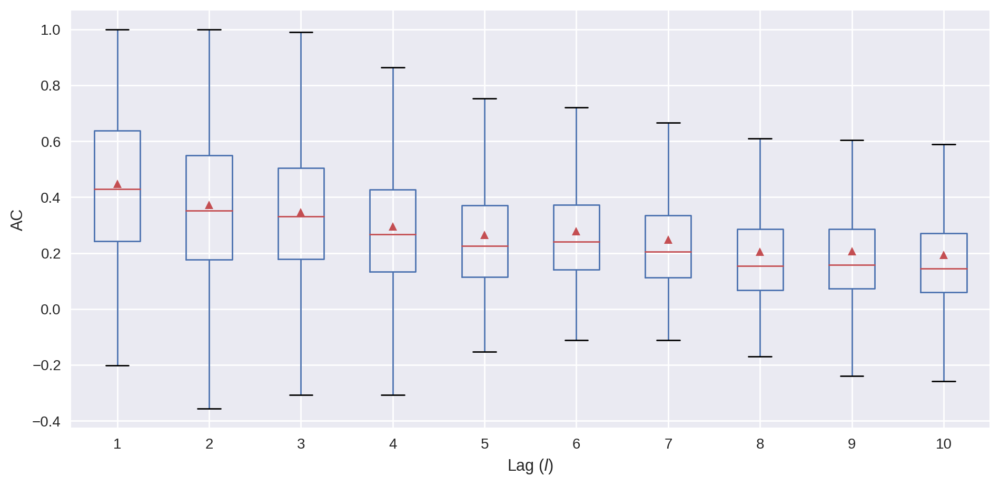

In [33]:
autocorrs.boxplot(showfliers=False, showmeans=True);plt.xlabel(r"Lag ($l$)");plt.ylabel(r"AC")

The distributions of $\rho_{x(t), x(t-l)}$suggest that while the average autocorrelation is decreasing, it is still extremely strong, indicating an AR process. While this is a very bad observation, it is also highly unprecise when using the plain vanilla $\rho$ which does not take intra-window coefficients into account, essentially making every AR with a higher order (i.e $l$) of 2 nonsensical.

#### B.) Partial Autocorrelation

In order to account for window delta bias, we can estimate the partial autocorrelation. Although the estimation of the PACF is non-trivial and we'll be using OLS for AR betas here, adding another layer of complexity, the naive autocorrelation is usually considered useless for lags > 2.

In [29]:
from statsmodels.tsa.stattools import pacf
p_autocorrs = tseries_filt_z[seed].apply(lambda x : pacf(x, 10).flatten()[1:]).T
p_autocorrs.columns = autocorrs.columns

Text(0, 0.5, 'PAC')

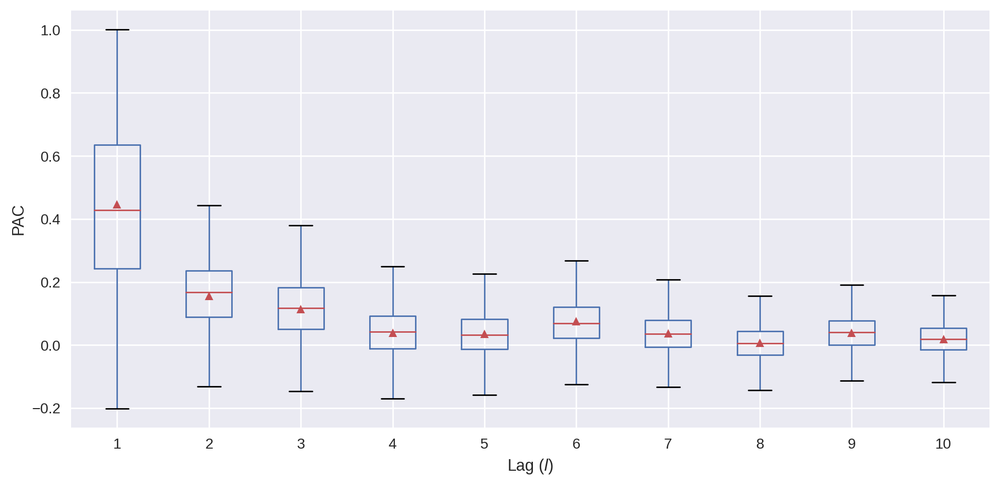

In [32]:
p_autocorrs.boxplot(showfliers=False, showmeans=True);plt.xlabel(r"Lag ($l$)");plt.ylabel(r"PAC")

Alright, thats still very bad imho. We should try to inject some of the AR logic into the model (the prewhitening approach from knapen is ok, but plain vanilla AR makes more sense here tbh).


#### B.) Event data

We are having 3 different types of events, characterized by their type (eye blinks, eye movement, visual stimulus) and by their temporal appearance $t$ (Not TR).

In [ ]:
!ls /content/data/hrf_mapper_59k/

# we'll load all the different event times we have, but will focus on the stimulus presentations for now.
blink_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv'), delimiter='\t')
sacc_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv'), delimiter='\t')
stim_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv'), delimiter='\t')

# and, for convenience, we'll also read in the confounds for later use here. 
# for example, the bold_confounds dataframe contains slow drift regressors...
# these are called CosineXXX.
import pandas as pd
bold_confounds = pd.read_csv(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv'), delimiter='\t')

Text(0.5, 1.0, 'Eye Movement')

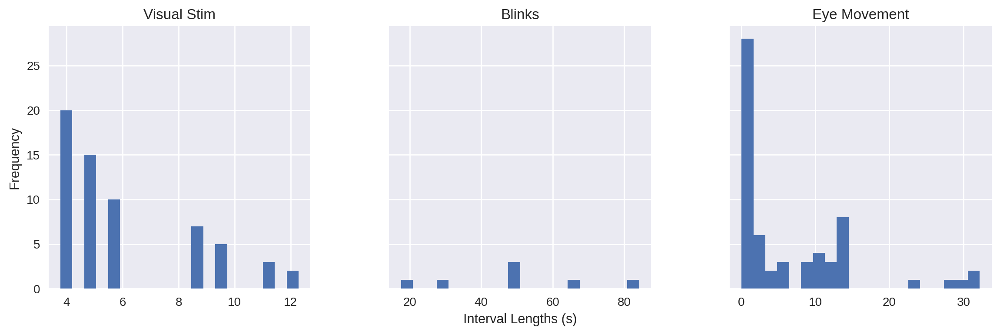

In [35]:
fig, ax = plt.subplots(1,3,sharey=True,figsize=(14,4));
pd.DataFrame(stim_times).diff().hist(bins=20,ax=ax[0]);
ax[0].set_title("Visual Stim");ax[0].set_ylabel("Frequency")
pd.DataFrame(blink_times).diff().hist(bins=20,ax=ax[1]);
ax[1].set_title("Blinks");ax[1].set_xlabel("Interval Lengths (s)")
pd.DataFrame(sacc_times).diff().hist(bins=20,ax=ax[2]);
ax[2].set_title("Eye Movement")

### Modeling

Now the real deal

In [36]:
tr = 0.945
n_timepoints=20
event_TRs = np.round(stim_times/tr).astype(int)

stim_TRs = np.floor(stim_times/tr).astype(int)
sacc_TRs = np.floor(sacc_times/tr).astype(int)
blink_TRs = np.floor(blink_times/tr).astype(int)

# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times
event_TRs = event_TRs[event_TRs < (tseries_raw.shape[1] - n_timepoints)]

stim_TRs = stim_TRs[stim_TRs < (tseries_raw.shape[1] - n_timepoints)]
sacc_TRs = sacc_TRs[sacc_TRs < (tseries_raw.shape[1] - n_timepoints)]
blink_TRs = blink_TRs[blink_TRs < (tseries_raw.shape[1] - n_timepoints)]

In [37]:
tseries_filt_z.shape

(440, 118584)

In [38]:
tseries_raw.shape

(118584, 440)

In [39]:
np.zeros((tseries_filt_z.shape[0], n_timepoints)).shape

(440, 20)

In [40]:
np.zeros((tseries_raw.shape[1], n_timepoints)).shape

(440, 20)

Creating the extended deisgn matrix

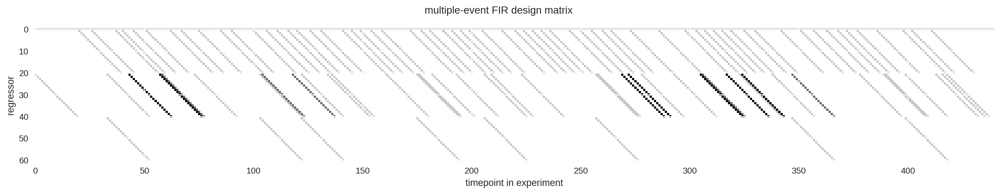

In [41]:
total_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
sacc_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
blink_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
stim_dm = np.zeros((tseries_raw.shape[1], n_timepoints))

for etr in event_TRs:
    total_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in stim_TRs:
    stim_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in sacc_TRs:
    sacc_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in blink_TRs:
    blink_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)

event_dm = np.hstack([stim_dm, sacc_dm, blink_dm])
glm_dm = np.hstack((np.ones((1,tseries_raw.shape[1])).T, event_dm))

plt.figure(figsize=(20,3))
plt.imshow(glm_dm.T)
plt.suptitle('multiple-event FIR design matrix')
plt.ylabel('regressor')
plt.xlabel('timepoint in experiment');

In [42]:
blink_dm.shape, stim_dm.shape, sacc_dm.shape, glm_dm.shape

((440, 20), (440, 20), (440, 20), (440, 61))

In [ ]:
tseries_psc = psc(tseries_raw, base="median")
tseries_psc.shape

In [44]:
tseries_filt_z.shape

(440, 118584)

In [45]:
tseries_filt_z = tseries_filt_z.values

Now fit

In [46]:
betas = np.linalg.lstsq(glm_dm, tseries_filt_z)[0]
yhat = np.dot(betas.T, glm_dm.T)
rsq = 1-(yhat-tseries_filt_z.T).var(1)/tseries_filt_z.T.var(1)

In [55]:
rsq_threshold = 0.525
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == roi_index_dict['V1']
V2_mask = atlas_data_both_hemis == roi_index_dict['V2']
V3_mask = atlas_data_both_hemis == roi_index_dict['V3']

responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V2_vertex_rsq = rsq[rsq_mask & V2_mask]
responsive_V3_vertex_rsq = rsq[rsq_mask & V3_mask]

#V1
responsive_V1_vertex_FIR_timecourses = betas[1:,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_blink_tc = betas[41:,rsq_mask & V1_mask]

#V2
responsive_V2_vertex_FIR_timecourses = betas[1:,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_blink_tc = betas[41:,rsq_mask & V2_mask]
#V3
responsive_V3_vertex_FIR_timecourses = betas[1:,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_blink_tc = betas[41:,rsq_mask & V3_mask]

351 responsive voxels detected in V1 using threshold 0.525
190 responsive voxels detected in V2 using threshold 0.525
49 responsive voxels detected in V3 using threshold 0.525


Text(0.5, 0, 'time [s]')

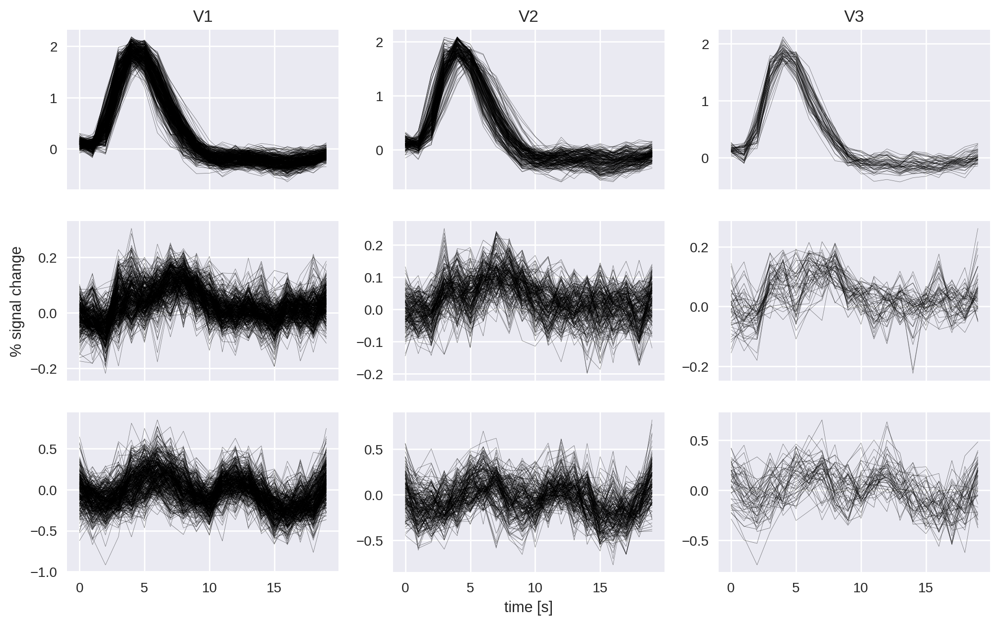

In [56]:
print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')

fig,axes = plt.subplots(3,3,figsize=(12,7.25), sharex=True)
for i, tc in enumerate(responsive_V1_vertex_FIR_stim_tc.T):
    axes[0,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_sacc_tc.T):
    axes[1,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_blink_tc.T):
    axes[2,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);

print(f'{responsive_V2_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V2 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V2_vertex_FIR_stim_tc.T):
    axes[0,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_sacc_tc.T):
    axes[1,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_blink_tc.T):
    axes[2,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);

print(f'{responsive_V3_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V3 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V3_vertex_FIR_stim_tc.T):
    axes[0,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_sacc_tc.T):
    axes[1,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_blink_tc.T):
    axes[2,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
    
  
axes[0,0].set_title("V1");axes[0,1].set_title("V2");axes[0,2].set_title("V3")
axes[1,0].set_ylabel('% signal change');
axes[2,1].set_xlabel('time [s]')

Above we show the three different event types and their estimated BOLD shapes with respect to their location. The three event types have different shape and all are more significant in V1.

Text(0.5, 1.0, 'Distribution of $R^2$')

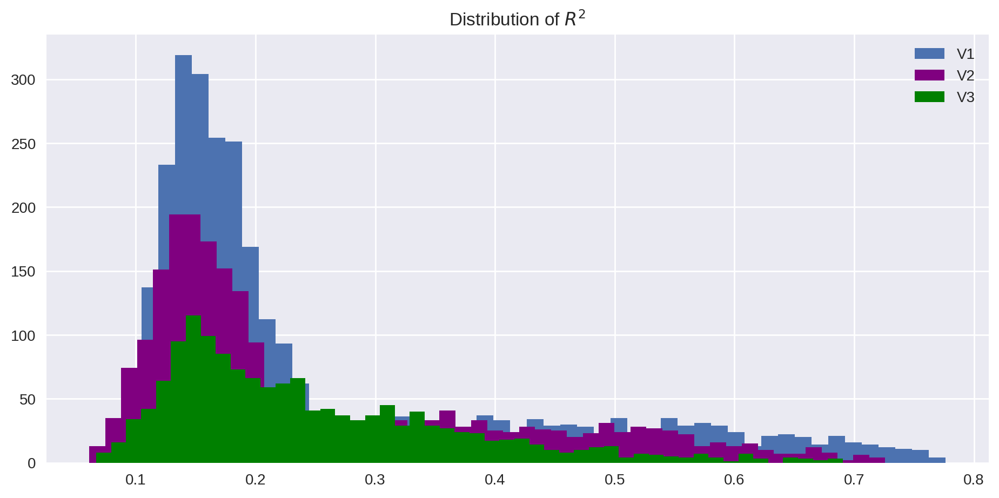

In [50]:
ax=pd.Series(rsq[V1_mask]).hist(bins=50);
pd.Series(rsq[V2_mask]).hist(bins=50,ax=ax,color="purple");
pd.Series(rsq[V3_mask]).hist(bins=50,ax=ax,color="green");plt.legend(["V1","V2","V3"]);plt.title(r"Distribution of $R^2$")

Above we show the distribution of $R^2$ for different locations.

Text(0.5, 1.0, 'V3')

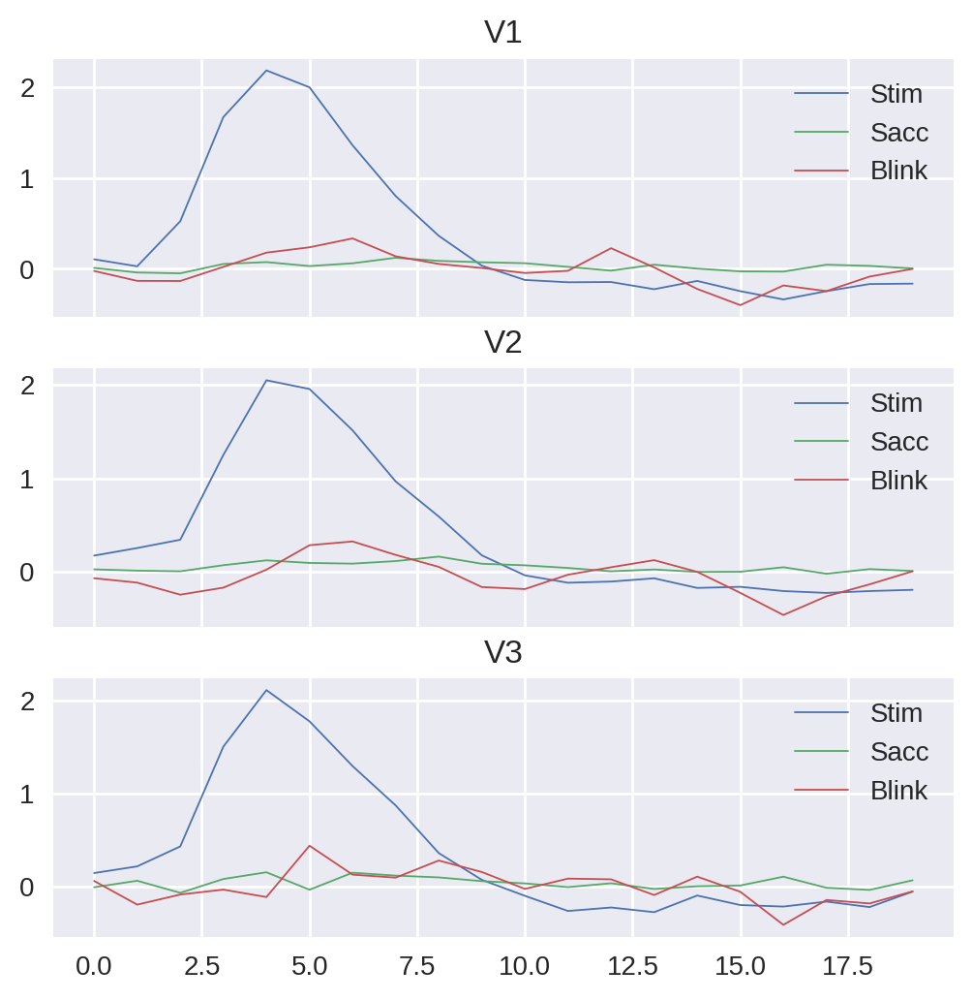

In [57]:
fig, axes = plt.subplots(3,1, sharex=True, figsize=(6,6));
pd.DataFrame(betas[1:21,V1_mask]).T.loc[[np.argmax(rsq[V1_mask])]].T.plot(ax=axes[0],lw=.65)
pd.DataFrame(betas[21:41,V1_mask]).T.loc[[np.argmax(rsq[V1_mask])]].T.plot(ax=axes[0],lw=.65)
pd.DataFrame(betas[41:,V1_mask]).T.loc[[np.argmax(rsq[V1_mask])]].T.plot(ax=axes[0],lw=.65);axes[0].legend(["Stim", "Sacc","Blink"]);axes[0].set_title("V1")

pd.DataFrame(betas[1:21,V2_mask]).T.loc[[np.argmax(rsq[V2_mask])]].T.plot(ax=axes[1],lw=.65)
pd.DataFrame(betas[21:41,V2_mask]).T.loc[[np.argmax(rsq[V2_mask])]].T.plot(ax=axes[1],lw=.65)
pd.DataFrame(betas[41:,V2_mask]).T.loc[[np.argmax(rsq[V2_mask])]].T.plot(ax=axes[1],lw=.65);axes[1].legend(["Stim", "Sacc","Blink"]);axes[1].set_title("V2")

pd.DataFrame(betas[1:21,V3_mask]).T.loc[[np.argmax(rsq[V3_mask])]].T.plot(ax=axes[2],lw=.65)
pd.DataFrame(betas[21:41,V3_mask]).T.loc[[np.argmax(rsq[V3_mask])]].T.plot(ax=axes[2],lw=.65)
pd.DataFrame(betas[41:,V3_mask]).T.loc[[np.argmax(rsq[V3_mask])]].T.plot(ax=axes[2],lw=.65);axes[2].legend(["Stim", "Sacc","Blink"]);axes[2].set_title("V3")

Above we show the vertices with the highest $R^2$ with respect to their location.

In [85]:
V1_AVG.shape

(20, 2939)

Now we are plotting the avergae timecourses (i.e averaged over the event types) with respect to location. We may got this question wrong because this averaging does not make any sense tbh, on the other side, averaging on the inverse axis will prevent calculating cis.

Text(0.5, 0, 'Post Event Time')

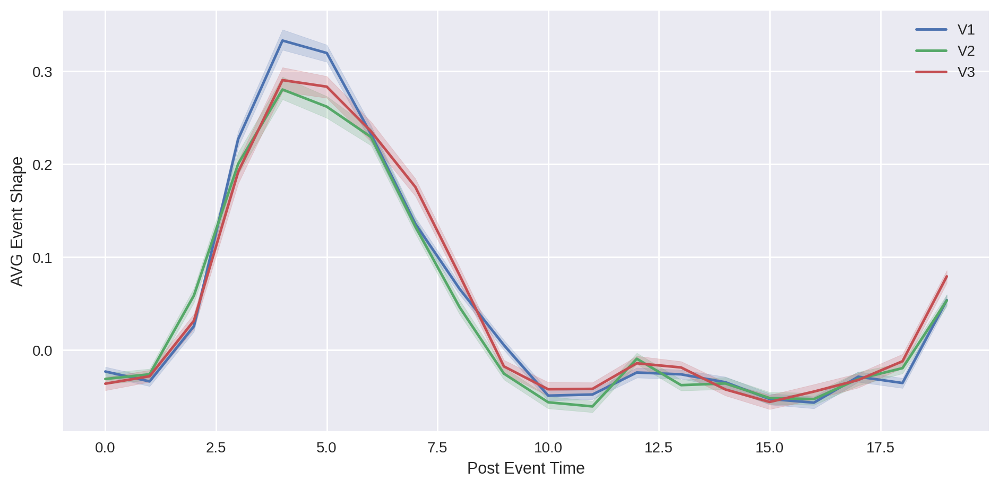

In [86]:
V1_AVG=((pd.DataFrame(betas[1:21,V1_mask]).T + pd.DataFrame(betas[21:41,V1_mask]).T + pd.DataFrame(betas[41:,V1_mask]).T)/3).T
V2_AVG=((pd.DataFrame(betas[1:21,V2_mask]).T + pd.DataFrame(betas[21:41,V2_mask]).T + pd.DataFrame(betas[41:,V2_mask]).T)/3).T
V3_AVG=((pd.DataFrame(betas[1:21,V3_mask]).T + pd.DataFrame(betas[21:41,V3_mask]).T + pd.DataFrame(betas[41:,V3_mask]).T)/3).T

ax=sns.lineplot(x="variable", y="value", data=V1_AVG.T.melt(), ci=99)
sns.lineplot(x="variable", y="value", data=V2_AVG.T.melt(),ax=ax, ci=99)
sns.lineplot(x="variable", y="value", data=V3_AVG.T.melt(),ax=ax, ci=99);plt.legend(["V1","V2","V3"])
ax.set_ylabel("AVG Event Shape");ax.set_xlabel("Post Event Time")

Now we add the proposed confounds to the design matrix

In [88]:
###2.)
confounds = ['stdDVARS', 'non-stdDVARS',
       'vx-wisestdDVARS', 'FramewiseDisplacement', 'tCompCor00', 'tCompCor01',
       'tCompCor02', 'tCompCor03', 'tCompCor04', 'tCompCor05', 'aCompCor00',
       'aCompCor01', 'aCompCor02', 'aCompCor03', 'aCompCor04', 'aCompCor05',
       'Cosine00', 'Cosine01', 'Cosine02', 'Cosine03', 'Cosine04']
nuisance_confounds = bold_confounds[confounds]
nuisance_confounds = np.nan_to_num(nuisance_confounds.values)
nuisance_confounds.shape

(440, 21)

In [89]:
glm_dm2=np.hstack([glm_dm, nuisance_confounds])
glm_dm2.shape

(440, 82)

This is already an undesirable design matrix as we lose double the df. Also mixing ints with doubles.


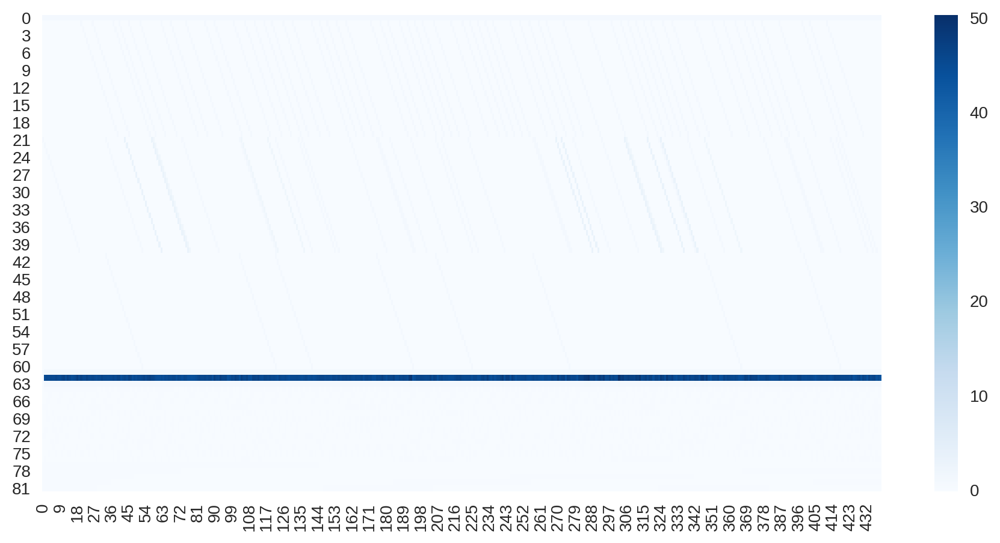

In [90]:
sns.heatmap(glm_dm2.T,cmap="Blues")

In [ ]:
betas = np.linalg.lstsq(glm_dm2, tseries_filt_z)[0]
yhat = np.dot(betas.T, glm_dm2.T)
rsq = 1-(yhat-tseries_filt_z.T).var(1)/tseries_filt_z.T.var(1)

Text(0.5, 0, 'Post Event Time')

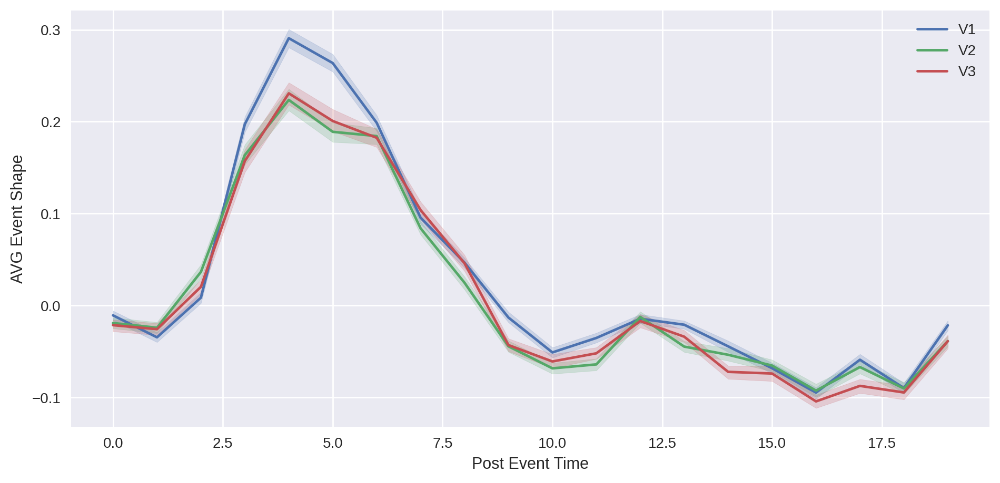

In [110]:
V1_AVG=((pd.DataFrame(betas[1:21,V1_mask]).T + pd.DataFrame(betas[21:41,V1_mask]).T + pd.DataFrame(betas[41:,V1_mask]).T)/3).T
V2_AVG=((pd.DataFrame(betas[1:21,V2_mask]).T + pd.DataFrame(betas[21:41,V2_mask]).T + pd.DataFrame(betas[41:,V2_mask]).T)/3).T
V3_AVG=((pd.DataFrame(betas[1:21,V3_mask]).T + pd.DataFrame(betas[21:41,V3_mask]).T + pd.DataFrame(betas[41:,V3_mask]).T)/3).T

ax=sns.lineplot(x="variable", y="value", data=V1_AVG.T.melt(), ci=99)
sns.lineplot(x="variable", y="value", data=V2_AVG.T.melt(),ax=ax, ci=99)
sns.lineplot(x="variable", y="value", data=V3_AVG.T.melt(),ax=ax, ci=99);plt.legend(["V1","V2","V3"])
ax.set_ylabel("AVG Event Shape");ax.set_xlabel("Post Event Time")

Another look at the $R^2$ distribution after incorporating the nuisance covariates.

Text(0.5, 1.0, 'Distribution of $R^2$')

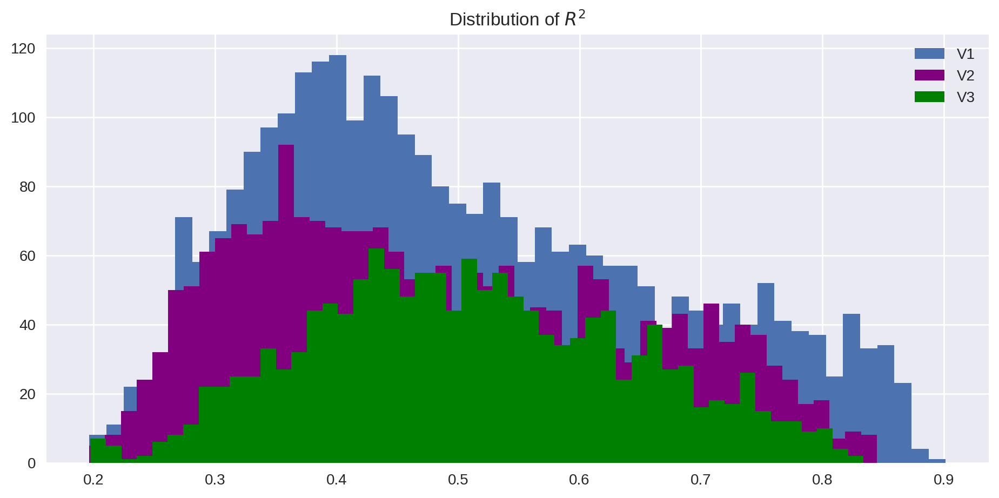

In [111]:
ax=pd.Series(rsq[V1_mask]).hist(bins=50);
pd.Series(rsq[V2_mask]).hist(bins=50,ax=ax,color="purple");
pd.Series(rsq[V3_mask]).hist(bins=50,ax=ax,color="green");plt.legend(["V1","V2","V3"]);plt.title(r"Distribution of $R^2$")

The $R^2$ distribution is better now, but this is because $R^2 = 1 - \frac{RSS}{TSS}$ is scaled by the dimensionality of the covariate space. Although thats what we see here, there is a number of reasons why the $R^2$ is not a good indicator of a model fit (Its actually a useless metric for the purpose of model fitness), however it can be used to compare how the vertices signals' respond given the variance of the covariates.

In [114]:

f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('')

['stdDVARS',
 'non-stdDVARS',
 'vx-wisestdDVARS',
 'FramewiseDisplacement',
 'tCompCor00',
 'tCompCor01',
 'tCompCor02',
 'tCompCor03',
 'tCompCor04',
 'tCompCor05',
 'aCompCor00',
 'aCompCor01',
 'aCompCor02',
 'aCompCor03',
 'aCompCor04',
 'aCompCor05',
 'Cosine00',
 'Cosine01',
 'Cosine02',
 'Cosine03',
 'Cosine04']

## Results

It's easiest to base your results section around a few (say, 4 or 5) key figures that illustrate what you've done and what you've found. These can be illustrations, flatmaps, time-courses and/or anything that you decide is a cool visualization of your results. You can start with a description of the data as you're getting it, basing yourself on the *Questions concerning signal quality* etc. above. 

Be sure to describe your figures with adequate captions. For these results, we will focus on qualitative descriptions and not so much on hard stats - which are harder to do on single subjects. 

I hope you will have fun creating this project and I also hope that your findings will reflect the fun you have. 

## Discussion

*   What have we learned? 
*   What should others be aware of? 
*   In what sense do your findings correspond to the literature you know, and in what sense do your findings deviate from the canon? 

What have you learned?

Feel free to add references that you've stumbled upon yourselves. 